# Ensemble Learning
Group Challenge

***
by: Paul Bédier, Lukasz Pszenny, Lasse Schmidt

within: MS Data Sciences & Business Analytics

at: CentraleSupélec & ESSEC Business School
***

### 1. Import Packages

In [32]:
from importlib import reload
reload(prepData)

<module 'util.preprocess_data' from 'D:\\Dokumente\\2_Bildung\\2_MSc\\1_Classes\\Y2T2_Ensemble Learning\\4_challenge\\Ensemble-Learning-on-AirBnb-dataset\\util\\preprocess_data.py'>

In [1]:
# import own scripts
import util.preprocess_data as prepData

In [3]:
# parse & handle data
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns

In [4]:
# set matplotlib and seaborn settings for nicer plots
%matplotlib inline

SMALL_SIZE = 6
MEDIUM_SIZE = 8
BIGGER_SIZE = 10

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

### 2. Load Data

In [5]:
# Read data
airbnb = pd.read_csv('data/AB_NYC_2019.csv', index_col=0)
airbnb.shape

(48895, 15)

In [6]:
# check type of every column in dataset
airbnb.dtypes

name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

### 3. Handle duplicates, missing values and outliers

In [7]:
# number of duplicates
airbnb.groupby(airbnb.columns.tolist(), as_index = False, dropna = False).size()["size"].describe()

count    48895.0
mean         1.0
std          0.0
min          1.0
25%          1.0
50%          1.0
75%          1.0
max          1.0
Name: size, dtype: float64

Our data contains no duplicates!

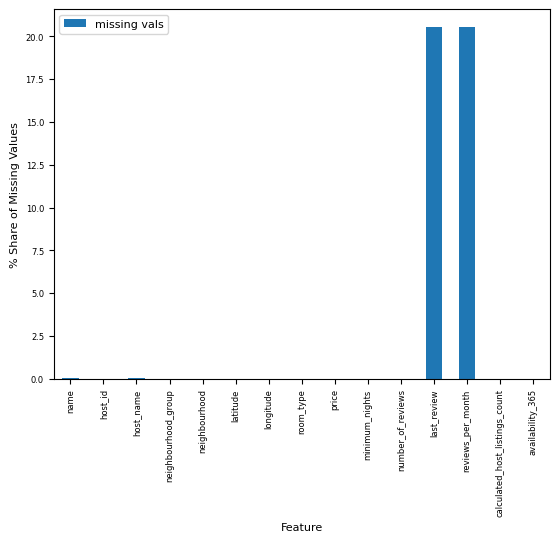

In [8]:
# number of missing values
prepData.show_missing_vals(airbnb)

Missing data does not need sophisticated treatment for the exploratory data analysis.

More specifically, "name" and "host_name" columns are likely irrelevant to the overall problem. Maybe we could apply some NLP techniques on the "name" of the listing to identify maybe some keywords that are correlated with higher prices, but we should only do this if later model performance is not sufficient. In contrast, we will drop the column "host_name" right away due to ethical reasons: we do not want our classifier to learn that some names (that sound e.g. more Western European) possibly generate higher listing prices than e.g. traditional names of African Americans or Indigeneous Groups.

The columns "last_review" (date of last review for respective listing) and "reviews_per_month" only have missing values if "number_of_reviews" is 0. "last_review" could be useful to maybe identify some recency metrics, so we will as a first step impute the missing values with the oldest possible date in the dataset. "reviews_per_month" is straightforward: if a listing has 0 total reviews, the number of reviews per month should be 0 as well.

In [9]:
airbnb, _ = prepData.impute_missing_vals(airbnb)
airbnb.head(3)

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,last_review_recency,last_review_recency_log_noise
id,,,,,,,,,,,,,,,,
2539,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,262,5.532974
2595,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,48,4.012398
3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,2011-03-28,0.00,1,365,3024,8.071956


Let us now consider **outliers**. More specifically, we will only consider the outliers in the target of this prediction task: the listing's price. Why is this an issue? Let us remind again the goal of this prediction: we want to create a model that can create good predictions for all kinds of different listings. However, the prices range from \$0 to 10,000 per night and both are clearly not representative prices of a typical AirBnb listing. 

For the case of price equal to \$0 per night, we can with very high probability assume quality issues -- few people would logically be interested into providing their apartment completely for free to the general public. However, this issue only concerns 11 listings (less than 0.02\% of listings). In consequence, we do not remove these values from our dataset.

With regard to extremely expensive listings, we face a different problem: there are 1988 observations (4.06\% of listings) with a price above or equal to \$400 per night. These values are more than 1 standard deviation above the mean. However, (see two cells below) they assume non-outlier feature values as we lack some key features that would allow us to easily distinguish luxury vs non-luxury listings, such as the square footage of the listing, the number of rooms, if there is a swimming pool or gym, etc. In consequence, our tree-based models will get distorted at a local level (e.g. the prediction, aka the mean, of each leaf node will be highly skewed by those outliers). We first thought that aggregation across many different trees would solve this issue but we saw that the predictive power of the algorithm was still very low (validation r2 never above .16).

In consequence, we have decided to explore both capping all 1988 prices that are more than 1 standard deviation above the mean (>= 400) to a fixed price of 400, or dropping them entirely. This way we still include the "premium" segment in our model but accept that we will not be able to accurately predict the "luxury" segment. Optimally, we would not do this -- however the lack of luxury vs non-luxury features leave us no other option.

In [9]:
airbnb.iloc[:,3:].describe() # do not compute stats for host_id

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_recency,last_review_recency_log_noise
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,40.728949,-73.952170,152.720687,7.029962,23.274466,1.090910,7.143982,112.781327,841.678331,5.030322
std,0.054530,0.046157,240.154170,20.510550,44.550582,1.597283,32.952519,131.622289,1169.872743,2.237039
min,40.499790,-74.244420,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-0.272651
25%,40.690100,-73.983070,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000,19.000000,3.001654
50%,40.723070,-73.955680,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000,186.000000,5.180856
75%,40.763115,-73.936275,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000,1201.000000,7.099168
max,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000,3024.000000,8.382333


In [10]:
airbnb.loc[airbnb["price"] >= 400].describe()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_recency,last_review_recency_log_noise
count,1.988000e+03,1988.000000,1988.000000,1988.000000,1988.000000,1988.000000,1988.000000,1988.000000,1988.000000,1988.000000,1988.000000
mean,8.917112e+07,40.734775,-73.975135,804.601610,8.698189,12.195171,0.781268,12.904930,171.411972,1268.562374,5.560929
std,9.173305e+07,0.040063,0.035157,916.279584,32.441957,27.736196,1.269823,51.471938,141.352023,1374.715551,2.349546
min,8.730000e+03,40.530760,-74.202950,400.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.462458
25%,9.561132e+06,40.715432,-73.995665,450.000000,2.000000,0.000000,0.000000,1.000000,10.000000,27.000000,3.313620
50%,4.660633e+07,40.737265,-73.981445,545.000000,3.000000,2.000000,0.170000,1.000000,173.000000,347.000000,5.896037
75%,1.727734e+08,40.760258,-73.963202,795.000000,5.000000,10.000000,1.000000,2.000000,321.250000,3024.000000,7.963165
max,2.740800e+08,40.886710,-73.739700,10000.000000,1000.000000,447.000000,14.000000,327.000000,365.000000,3024.000000,8.349429


In [11]:
# handle outliers (here with cap)
airbnb = prepData.clip_target(airbnb, method = 'replace')

In [12]:
airbnb.describe()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_recency,last_review_recency_log_noise
count,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,6.762001e+07,40.728949,-73.952170,136.270171,7.029962,23.274466,1.090910,7.143982,112.781327,841.678331,5.029069
std,7.861097e+07,0.054530,0.046157,92.153613,20.510550,44.550582,1.597283,32.952519,131.622289,1169.872743,2.236883
min,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-0.248543
25%,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000,19.000000,3.000522
50%,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000,186.000000,5.178680
75%,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000,1201.000000,7.098124
max,2.743213e+08,40.913060,-73.712990,400.000000,1250.000000,629.000000,58.500000,327.000000,365.000000,3024.000000,8.443019


### 4. Analyse Data

Let us now split our data into three types: categorical, geographical, numerical, others. Each type needs a different approach during analysis.

Also please note that all data analysis is performed on the original prices (outliers are present and not clipped). The outlier removal is only relevant for the modeling part.

In [13]:
feature_dict = {
    "cat": ["host_id", "room_type"],
    "geo": ["neighbourhood_group", "neighbourhood", "latitude", "longitude"],
    "num": ["price", "clipped_price", "minimum_nights", "number_of_reviews", "reviews_per_month",
            "calculated_host_listings_count", "availability_365", "last_review_recency", "last_review_recency_log_noise"],
    "oth": ["name"]
}

#### 4.1 Categorical Features

In [14]:
print(feature_dict["cat"])

['host_id', 'room_type']


**4.1.1 Hosts**

In [15]:
# how many hosts are in the dataset?
airbnb.host_id.nunique()

37457

In [16]:
# who are the top hosts by number of listings?
airbnb.host_id.value_counts().head(10)

219517861    327
107434423    232
30283594     121
137358866    103
16098958      96
12243051      96
61391963      91
22541573      87
200380610     65
7503643       52
Name: host_id, dtype: int64

In [17]:
# how many listings belong to the top1% of all hosts?
topK = 0.01
nbr_hosts = airbnb.host_id.nunique()
print(f"Share of listings that belong to Top {int(topK*100)}% of hosts: {int(round(sum(airbnb.host_id.value_counts().values[:int(topK * nbr_hosts)]) / len(airbnb), 2) * 100)}%")

Share of listings that belong to Top 1% of hosts: 10%


Our Dataset contains 48895 listings.
Our Dataset encompasses 774.9102095999984 Mio. USD yearly revenue.


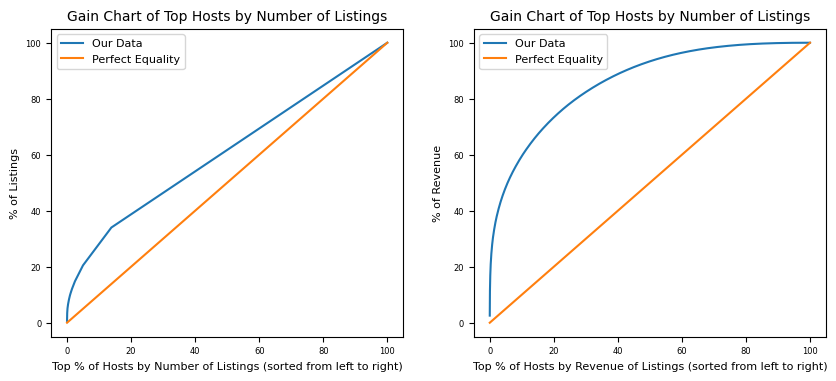

In [18]:
# plot gain chart of hosts by (1) number of listings, (2) yearly revenue of listings
fig, ax = plt.subplots(1, 2, figsize = (10, 4))

# (1) by number of listings

## compute share of listings per host
listings_per_host = np.cumsum(airbnb.host_id.value_counts().values)
x = [(i / len(listings_per_host)) * 100 for i in range(0, len(listings_per_host))]

## plot data
ax[0].plot(x, listings_per_host / len(airbnb) * 100, label = "Our Data")
ax[0].plot(x, x, label = "Perfect Equality")
ax[0].set_title("Gain Chart of Top Hosts by Number of Listings")
ax[0].set_xlabel("Top % of Hosts by Number of Listings (sorted from left to right)")
ax[0].set_ylabel("% of Listings")
ax[0].legend()

print(f"Our Dataset contains {max(listings_per_host)} listings.")

# (2) by yearly revenue of listings
##    - assuming 80% sell out which probably only professional hosts achieve
##    - exluding all listings that have availability_365 == 0 (probably information is not up to date)

## compute revenue per host
yearly_revenue_per_host = np.cumsum(airbnb.loc[airbnb["availability_365"] > 0]
    .assign(yearly_revenue = lambda df_: 0.8 * df_.price * df_.availability_365)
    .groupby(["host_id"])["yearly_revenue"].sum().sort_values(ascending = False)
)
x = [(i / len(yearly_revenue_per_host)) * 100 for i in range(0, len(yearly_revenue_per_host))]

## plot data
ax[1].plot(x, yearly_revenue_per_host/max(yearly_revenue_per_host) * 100, label = "Our Data")
ax[1].plot(x, x, label = "Perfect Equality")
ax[1].set_title("Gain Chart of Top Hosts by Number of Listings")
ax[1].set_xlabel("Top % of Hosts by Revenue of Listings (sorted from left to right)")
ax[1].set_ylabel("% of Revenue")
ax[1].legend()

print(f"Our Dataset encompasses {max(yearly_revenue_per_host) / 1e6} Mio. USD yearly revenue.")

The above plot on the left hand side shows the "inequality" among the hosts: few hosts provide many listings. For example, the top 1% of all hosts (by number of listings) contribute 10% of all listings. This inequality is substantial but much less than what we usually see in income charts. To demonstrate this, we plotted on the right hand side the share of revenue where revenue = price $\times$ availability_365 * 0.8 (multiplied with 0.8 as we assume only 80% sell out). Also, we removed any listings where the availability is equal to 0 (probably information for this listing not up to date) to avoid skewing the chart too much in favor of the highest earning donors. In this chart, the inequality is quite extreme and follows the well-known pareto rule: the top 20% of donors (by yearly revenue) generate 80% of total revenue in the airbnb market in New York City.

As the pareto rule is applicable, we can directly deduce that the revenue is distributed across the hosts in a power law. But it is even the case for the number of listings! To demonstrate this, let us plot a histogram of the number of listings per host. If the plot shows a linear relation in the loglog scale, it means that the underlying distribution follows a power law. (Hint1: based on what we already know, it definitely should) (Hint2: and it does!)

Text(0.5282090928819461, 0.5, 'Number of Hosts')

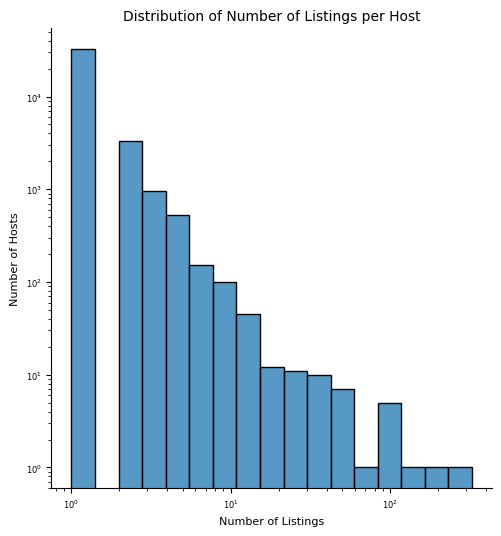

In [19]:
# plot distribution of number of listings per host
sns.displot(airbnb.host_id.value_counts().values, fill = True, log_scale = (True, True), common_norm = True)

# plot options
plt.title("Distribution of Number of Listings per Host")
plt.xlabel("Number of Listings")
plt.ylabel("Number of Hosts")

**4.1.2 Room Type**

Our Dataset contains the following room types: ['Private room' 'Entire home/apt' 'Shared room']


(0.0, 600.0)

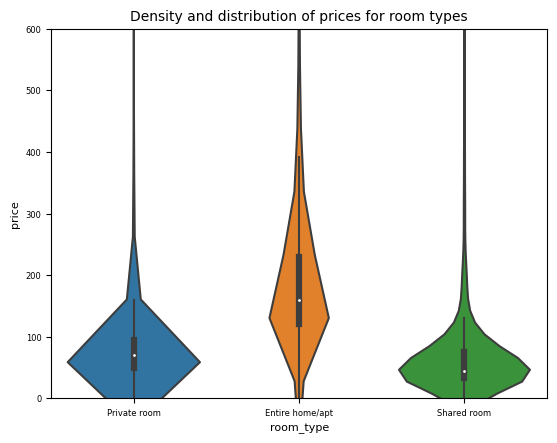

In [20]:
# let us look at the average price per room type (violin chart)
# we have to truncate extreme values as violin chart on logarithmic scale can be easily misleading (also some prices = 0, which makes use of logarithm even more challenging)
print(f"Our Dataset contains the following room types: {airbnb.room_type.unique()}")
sns.violinplot(data = airbnb, x='room_type', y='price', log_scale = (True, True))
plt.title('Density and distribution of prices for room types')
plt.ylim((0, 600))

The results are as expected:
- shared rooms are the least expensive and rarely go beyond 100 USD per night
- private rooms are a bit more expensive but most values concentrate around the median as well
- entire home/apt are much more expensive (median around 160 USD per night) and values are not concentrated around the median --> these locations can be very expensive very fast

Let us now encode the room_type feature so that all tree methods can easily work with this feature. Luckily, this is easy as room_type is clearly an ordinal variable (worst option is shared room, next one is private, best one is entire home).

In [21]:
airbnb = prepData.encode_room_type(airbnb)
airbnb.head(3)

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,last_review_recency,last_review_recency_log_noise,clipped_price,room_type_enc
id,,,,,,,,,,,,,,,,,,
2539,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,262,5.567443,149,1
2595,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,48,3.930746,225,2
3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,2011-03-28,0.00,1,365,3024,8.133118,150,1


#### 4.2 Geographical Features

In [22]:
print(feature_dict["geo"])

['neighbourhood_group', 'neighbourhood', 'latitude', 'longitude']


It is clear that a good location will be a clear driver for the price of the listing: Airbnb travellers love good locations with good access to e.g. the subway and short commutes to popular sights.

In consequence, the location of the listing should be an important predictor for our model. However, just using latitude and longitude might be too hard: we will be using tree-based methods, where often (e.g. in RandomForests) it is not clear which feature will be used for the split (but latitude and longitude heavily depend on each other).

**4.2.1 Mapping of each listing with official geographical hierarchies of NYC**

One good idea to enrich the dataset would be to include demographic & economic indicators for each region. Why? When overall rent and property prices in one area are much higher, chances are that the price of the airbnb is also going to be higher. Unfortunately, we are not provided the size of the listing (because a small airbnb in an expensive place might be of same price as large airbnb in a cheap place), however public data might still help our models.

Unfortunately, the "neighbourhood" feature cannot be mapped with official databases (e.g. from https://opendata.cityofnewyork.us/) as the names are slightly different. However, we have access to the latitude and longitude of the listing! In consequence, by downloading the spatial data from open databases, we can easily categorize each listing into the official geographic hierarchies of NYC, namely:
1. Level consists of 5 Boroughs (equivalent to neighbourhood_groups feature in our dataset, let us rename the column to Borough to avoid any confusion)
2. Level consists of 71 Community Districts (CD)
3. Level consists of 262 Neighbourhoods (NTA)
4. Level consists of 2,325 Census Tracts (CT)

One important thing to note: two CDs (Queens CD 401 and Bronx CD 208) cross borough boundaries, and therefore CDs will not add up to borough totals for the Bronx, Queens, and Manhattan. Similarly, one NTA (BX0802) crosses borough boundaries, and therefore NTAs will not add up to borough totals for the Bronx and Manhattan. Also note that census tracts in New York City’s water areas are excluded.

Let us now assign to each listing its respective geographic hierarchy. Afterwards, we will enrich the dataset using these geographical features.

In [23]:
airbnb, lvl1, lvl2, lvl3, lvl4 = prepData.load_official_geo_hierarchies(airbnb)

In [24]:
airbnb.shape

(48895, 25)

In [25]:
airbnb.head(1)

,name,host_id,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,...,room_type_enc,geometry,lvl1_GeoID,lvl1_name,lvl2_GeoID,lvl2_name,lvl3_GeoID,lvl3_name,lvl4_GeoID,lvl4_name
id,,,,,,,,,,,,,,,,,,,,,
2539,Clean & quiet apt home by the park,2787,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,...,1,POINT (-73.97237 40.64749),3,Brooklyn,312,Borough Park-Kensington,BK1203,Kensington,36047050402,Borough Park-Kensington


**4.2.2 Enriching our Dataset**

Based on these very detailed clusters, we will now do two things:

1. Get relevant public data for the cluster (e.g. population, housing & income statistics, distance to nearest subway station)
2. Handle missing values
3. Perform target encoding
4. Compute if a given host is under or overpricing

**First Part**: Get relevant public data -- Note that the NYC public datasets also include statistics on the ethnicities of the population. We will not use this information to train our model out of ethical considerations.

In [26]:
airbnb, lvl1, lvl2, lvl3, lvl4 = prepData.load_official_geo_hierarchies_data(airbnb, lvl1, lvl2, lvl3, lvl4)

In [27]:
airbnb.shape

(48895, 64)

In [28]:
airbnb.head(1)

,name,host_id,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,...,lvl4_VacHU_PCh,lvl4_listings_count,lvl4_listings_count_norm,lvl3_CvLFUEm1P,lvl3_MnTrvTmE,lvl3_HH2E,lvl3_Inc_SoSecP,lvl3_Inc_RtrmtP,lvl3_MnHHIncE,lvl3_MdEWrkE
id,,,,,,,,,,,,,,,,,,,,,
2539,Clean & quiet apt home by the park,2787,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,...,-35.3,13,6.487026,3.8,44.2,13879,20.4,13.8,96241.0,43399.0


**Second Part:** We have merged many new values. Let us handle any missing values that have appeared.

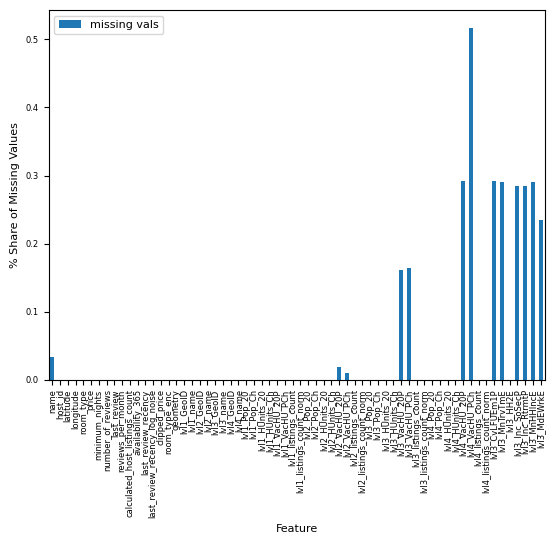

In [29]:
# number of missing values
prepData.show_missing_vals(airbnb)

We have only very, very few missing values (less than 0.5% in the worst column). Also, it is very likely that those missing values are affecting the same rows. Lastly, besides the name column (which we will handle later), we only see missing values in numerical columns. In consequence, we will simply impute them using the value of the level above (e.g. if a Neighbourhood [lvl3] in a Community District [lvl2] of Manhattan [lvl1] has a missing value, we will use the average of the Community District). If values above are not available (e.g. for data of American Community Survey), take global average.

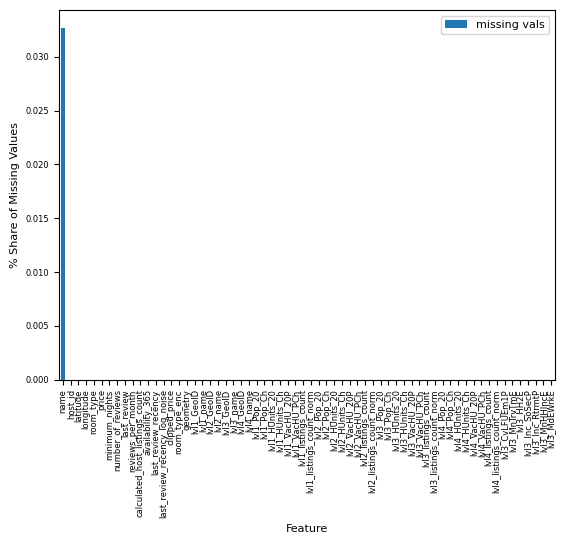

In [30]:
airbnb, _ = prepData.impute_missing_geo_vals(airbnb, lvl1, lvl2, lvl3, lvl4)
prepData.show_missing_vals(airbnb)

All missing values are gone! (besides name column, which we will handle later)

**Third Part:** Target encoding.

Our categorical features are of increasing cardinality (up to 2,325 clusters). Because of this, techniques like one-hot-encoding would lead to extremely sparse matrices. Trees might still work with this kind of data, but computationally speaking this is very inefficient (also, if for each split we only consider a subset of our features as candidates, we might end up biasing our trees to only perform splits using the one-hot encoded data as they would make up a huge percentage of our overall features). But even if we directly used target encoding, the increasing cardinality might create problems. For example, maybe a specific level 4 region has only one listing. Calculating this entries mean and standard deviation might not be representative of the population in this subregion and could introduce both high bias and high variance.

While searching online, we found a potential method to deal with this problem: *Empirical Bayes Target Encoding*, which is described in detail in the paper "A Preprocessing Scheme for High-Cardinality Categorical Attributes in Classification and Prediction Problems" by Daniele Micci-Barreca (weblink: https://dl.acm.org/doi/10.1145/507533.507538). A good understanding of the paper can be deduced from this web article (written by the same author): https://towardsdatascience.com/extending-target-encoding-443aa9414cae.

In consequence, we will use Empirical Bayes Target Encoding to meaningfully encode the categorical features. The actual geographical features (latitude + longitude) will remain unchanged.

Overall, we will encode the target **median** (prices are distributed extremely heavy-tailed) as well as the target standard deviation (to understand the variance of prices at local level).

For our case, the mathematical formulation for the target encoding of the median price looks like this (we will also do the same for the standard deviation):

$$\text{Empirical Bayes Target Encoding }(L_{0}, L_{1}, L_{2}) = \lambda_{L_{2}} \times \text{target_median}_{L_{2}} + (1 - \lambda_{L_{2}}) \times \text{Empirical Bayes Target Encoding }(L_{0}, L_{1})$$

$$\text{Empirical Bayes Target Encoding }(L_{0}, L_{1}) = \lambda_{L_{1}} \times \text{target_median}_{L_{1}} + (1 - \lambda_{L_{1}}) \times \text{target_median}_{L_{0}} $$

$$\text{Blending Factor 1: }\lambda_{L_{i}} = \frac{n_{L_{i}} \times \text{Var}_{L_{i-1}}}{\text{Var}_{L_{i}} + n_{L_{i}} \times \text{Var}_{L_{i-1}}}$$

$$\text{Blending Factor 2: }\lambda_{L_{i}} = \frac{1}{1 + \exp^{-\frac{(n_{L_{i}}-k)}{f}}}$$

where
- $L_{0}$ relates to all the data, $L_{1}$ relates to the data of the current neighbourhood_group, $L_{2}$ to the data of the current neighbourhood 
- $n_{L_{i}}$ is the number of datapoints included in the current level
- $k$ is half of the minimal sample size for which we completely trust the target estimator based on the sample in the current level
- $f$ controls rate of transition between cell's posterior probability and the prior probability (for small f, the formula becomes a hard threshold between posterior and prior target encoding)

and we continue with this iterative formula until the fourth layer

Why two blending factors? First blending factor has nice theoretical fundation, but if sample size on current level is 1, the blending factor will by default go to 0.5 (not optimal and probably there will be a lot of regions with small sample size on last level). Also, one important (and very wrong assumption) of this approach is that we assume the probability distribution to be Gaussian (of the prices within the chosen subregion as well as of the posterior).

The second blending factor is in contrast a simple sigmoid function that does not take into account varying variances on the different levels (computationally more efficient and easier to understand blending process; with parameter k we can easily control the minimum needed sample size in current level for which we will assign 0.5 blending probability).

In [31]:
airbnb, _ = prepData.encode_target(airbnb, lambda_type = "sigmoid", k = 5, f = 1.5)

**Fourth Part:** Market Index per Host.

Now we have successfully compute the target encoding of each geographic level. This allows us to do another interesting analysis: on average, across all the listings of a given host, does the host tend to over- or underprice his property compared to the target encoding of the respective region of each listing?

In [33]:
market_index_per_host = (airbnb
    .assign(lvl4_diff = lambda df_: (df_.price - df_.lvl4_target_m)/df_.lvl4_target_m)
    .groupby("host_id")
    .agg({"host_id": "count", "lvl4_diff": "mean"})
    .rename(columns = {"host_id": "count_listings"})
)

market_index_per_host.corr()

,count_listings,lvl4_diff
count_listings,1.000000,-0.005654
lvl4_diff,-0.005654,1.000000


We can clearly see that there is no correlation at all between number of listings and the price differences. In consequence, we cannot say that e.g. hosts with higher number of listings tend to over- / underprice differently compared to hosts with lower number of listings.

In [34]:
airbnb, _ = prepData.get_market_index_per_host(airbnb, min_listings = 0)

**4.3 Analysis of Geographical Features**

Our Dataset contains the following neighbourhood groups: ['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']


(0.0, 600.0)

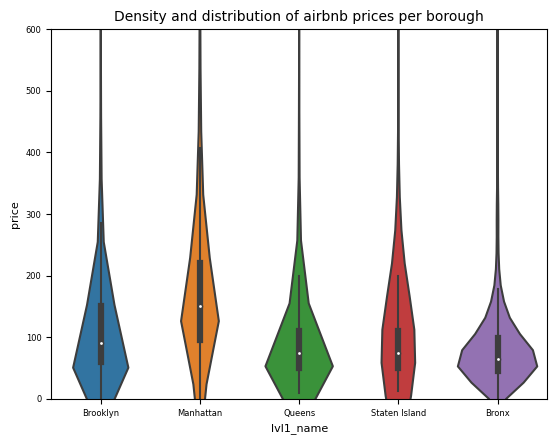

In [35]:
# let us look at the average price per neighbourhood group (violin chart)
# we have to limit y-axis as violin chart on logarithmic scale can be easily misleading (also some prices = 0, which makes use of logarithm even more challenging)
print(f"Our Dataset contains the following neighbourhood groups: {airbnb.lvl1_name.unique()}")
sns.violinplot(data = airbnb, x='lvl1_name', y='price', log_scale = (True, True))
plt.title('Density and distribution of airbnb prices per borough')
plt.ylim((0, 600))

The results are as expected:
- Manhattan has the highest price range and highest median price (150 USD per night)
- Brooklyn shows also high price range but only slightly above median price of other regions (90 USD per night)
- Queens, Staten Island and Bronx show very similar median prices of around 80 USD per night
- Bronx is the cheapest overall

When considering the actual neighborhoods, there are too many to plot them (see cell below). Even more so the case for the Census Tracts.

In [36]:
print(f"Number of unique neighbourhoods in dataset: {airbnb.lvl3_GeoID.nunique()}")
print(f"Number of unique census tracts in dataset: {airbnb.lvl4_GeoID.nunique()}")

Number of unique neighbourhoods in dataset: 225
Number of unique census tracts in dataset: 2038


However, we can look at the distribution of the number of listings per neighbourhood!

Text(6.069444444444445, 0.5, 'Number of Neighbourhoods')

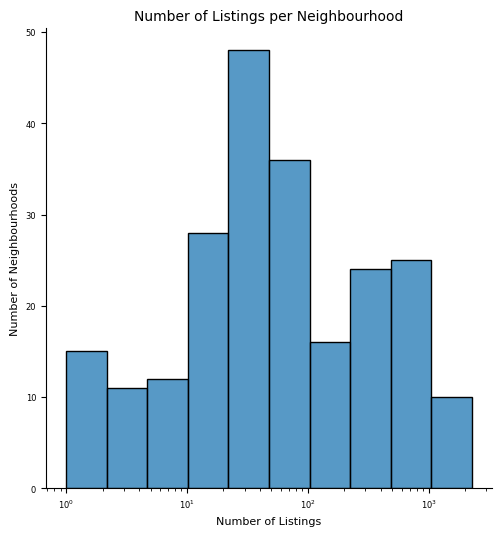

In [37]:
# plot distribution of number of listings per neighbourhood
sns.displot(airbnb.lvl3_GeoID.value_counts().values, fill = True, log_scale = (True, False), common_norm = True)

# plot options
plt.title("Number of Listings per Neighbourhood")
plt.xlabel("Number of Listings")
plt.ylabel("Number of Neighbourhoods")

Some neighbourhoods have only very few listings (e.g. 13 neighbourhoods have less than 10 listings) while others have a lot (e.g. 20 neighbourhoods have more than 1,000 listings)! In consequence, the above proposed hierarchical target encoding could be a very good idea!

Why? For neighbourhoods with few listings we will still be able to generate a meaningful target encoding that is not overfitting (because for these neighbourhoods, we will encode them using mostly the information from the previous layer, as in the respective neighbourhood_group).

**4.4 Visualisation of Geographical Features**

In [38]:
lvl4.dtypes

geometry               geometry
CTLabel                 float64
BoroCode                  int64
BoroName                 object
CT2020                    int64
BoroCT2020                int64
CDEligibil              float64
NTAName                  object
NTA2020                  object
CDTA2020                 object
name                     object
GeoID                    object
Shape_Leng              float64
Shape_Area              float64
Pop_20                    int64
Pop_Ch                    int64
HUnits_20                 int64
HUnits_Ch                 int64
VacHU_20P               float64
VacHU_PCh               float64
listings_count            int64
listings_count_norm     float64
dtype: object

In [39]:
# plot result (choose any numeric column from the dtypes above // choose any dataframe: lvl2, lvl3, lvl4)
lvl4.explore("listings_count_norm", tiles = "CartoDB positron")

Also, we will have a look at the results of the Target Encoding below!

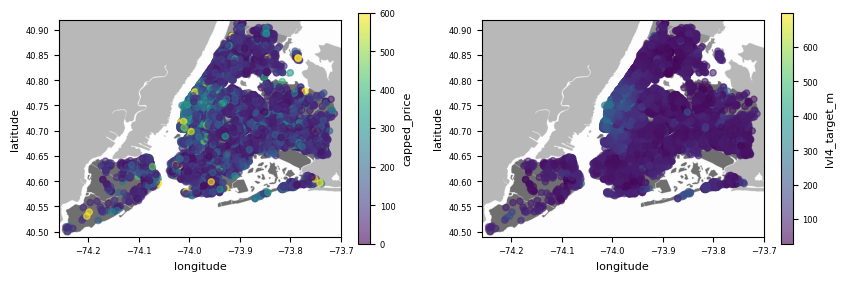

In [49]:
# which features we want to overlay on NYC map
plot_fts = ["capped_price", "lvl4_target_m"]

# remove outliers (they will distort our price plot otherwise)
cap = 600
airbnb_no_extreme_prices = airbnb.assign(capped_price = lambda df_: df_.price.where(df_.price < cap, cap))

# create canvas where we will overlay our features
fig, axs = plt.subplots(1, 2, figsize = (10, 3))

for ax, ft in zip(axs.flatten(), plot_fts):

    # (1) map of NYC
    nyc_map = Image.open("data/New_York_City_.png")
    ax.imshow(nyc_map, zorder = 0, extent = [-74.258, -73.7, 40.49, 40.92]) # scale image according to latitude and longitude min & max
    
    # (2) scatterplot of capped prices on top
    airbnb_no_extreme_prices.plot(kind = "scatter", x = "longitude", y = "latitude", c = ft, colormap = "viridis",
                                  ax = ax, colorbar = True, alpha = 0.6, zorder = 5)

The results make a lot of sense:
- first plot (capped_price) shows what we already know --> Manhattan is most expensive, etc
- plot to the right shows smoothed picture

#### 4.3 Numerical Features

In [50]:
# append new numerical features to feature dict
feature_dict["num"] = list(airbnb.select_dtypes(include=[np.number]).columns.values)[3:]

In [51]:
print(feature_dict["num"])

['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'last_review_recency', 'last_review_recency_log_noise', 'clipped_price', 'room_type_enc', 'lvl1_Pop_20', 'lvl1_Pop_Ch', 'lvl1_HUnits_20', 'lvl1_HUnits_Ch', 'lvl1_VacHU_20P', 'lvl1_VacHU_PCh', 'lvl1_listings_count', 'lvl1_listings_count_norm', 'lvl2_Pop_20', 'lvl2_Pop_Ch', 'lvl2_HUnits_20', 'lvl2_HUnits_Ch', 'lvl2_VacHU_20P', 'lvl2_VacHU_PCh', 'lvl2_listings_count', 'lvl2_listings_count_norm', 'lvl3_Pop_20', 'lvl3_Pop_Ch', 'lvl3_HUnits_20', 'lvl3_HUnits_Ch', 'lvl3_VacHU_20P', 'lvl3_VacHU_PCh', 'lvl3_listings_count', 'lvl3_listings_count_norm', 'lvl4_Pop_20', 'lvl4_Pop_Ch', 'lvl4_HUnits_20', 'lvl4_HUnits_Ch', 'lvl4_VacHU_20P', 'lvl4_VacHU_PCh', 'lvl4_listings_count', 'lvl4_listings_count_norm', 'lvl3_CvLFUEm1P', 'lvl3_MnTrvTmE', 'lvl3_HH2E', 'lvl3_Inc_SoSecP', 'lvl3_Inc_RtrmtP', 'lvl3_MnHHIncE', 'lvl3_MdEWrkE', 'lvl4_target_m', 'lvl4_target_s', 'market_index']


In [52]:
# visualize distributions of our numerical features

# (1) subset dataframe
num_fts = feature_dict['num']
num_fts_df = airbnb.loc[:, num_fts]

# (2) initialise subplots
fig, axs = plt.subplots(11, 5, figsize = (60, 100))
fig.tight_layout(w_pad = 40, h_pad = 20)

# (3) create plots
for i, ax in enumerate(axs.flat):
    if i < len(num_fts):
        sns.kdeplot(num_fts_df.iloc[:, i], bw_method = 1.5, ax = ax, cut = 0, fill = True)
        ax.tick_params(axis = 'both', which = 'major', labelsize = 30)
        ax.set_xlabel(num_fts[i], fontsize = 30)
        ax.set(ylabel = None)

Some of our features are very heavy tailed (e.g. number_of_reviews). Many machine learning techniques would require us to transform the data to allow for better convergence. This is not the case however for tree based methods as they are invariant to the scaling of inputs! Thus, we will not apply any transformations to our numerical data.

In [53]:
airbnb.columns

Index(['name', 'host_id', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'last_review_recency',
       'last_review_recency_log_noise', 'clipped_price', 'room_type_enc',
       'geometry', 'lvl1_GeoID', 'lvl1_name', 'lvl2_GeoID', 'lvl2_name',
       'lvl3_GeoID', 'lvl3_name', 'lvl4_GeoID', 'lvl4_name', 'lvl1_Pop_20',
       'lvl1_Pop_Ch', 'lvl1_HUnits_20', 'lvl1_HUnits_Ch', 'lvl1_VacHU_20P',
       'lvl1_VacHU_PCh', 'lvl1_listings_count', 'lvl1_listings_count_norm',
       'lvl2_Pop_20', 'lvl2_Pop_Ch', 'lvl2_HUnits_20', 'lvl2_HUnits_Ch',
       'lvl2_VacHU_20P', 'lvl2_VacHU_PCh', 'lvl2_listings_count',
       'lvl2_listings_count_norm', 'lvl3_Pop_20', 'lvl3_Pop_Ch',
       'lvl3_HUnits_20', 'lvl3_HUnits_Ch', 'lvl3_VacHU_20P', 'lvl3_VacHU_PCh',
       'lvl3_listings_count', 'lvl3_listings_count_norm', 'lvl4_Pop_20',
       'lvl4_Pop_Ch', '

In [54]:
airbnb.describe()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_recency,...,lvl3_CvLFUEm1P,lvl3_MnTrvTmE,lvl3_HH2E,lvl3_Inc_SoSecP,lvl3_Inc_RtrmtP,lvl3_MnHHIncE,lvl3_MdEWrkE,lvl4_target_m,lvl4_target_s,market_index
count,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,...,48895.000000,48895.00000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.090910,7.143982,112.781327,841.678331,...,3.996558,36.25581,23667.156969,22.587501,12.297543,129479.004102,58550.360455,117.954076,149.200913,0.297693
std,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.597283,32.952519,131.622289,1169.872743,...,1.220023,6.91210,9219.021611,5.977479,4.115672,61423.898187,23259.987666,51.894221,174.208880,1.784525
min,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,1.600000,19.10000,0.000000,5.300000,3.400000,40347.000000,1249.000000,28.215839,3.317284,-1.000000
25%,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000,19.000000,...,3.000000,29.80000,16493.000000,18.500000,9.800000,83391.000000,40007.000000,75.001326,61.222088,-0.252874
50%,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000,186.000000,...,3.996558,37.00000,22490.000000,22.100000,11.600000,109013.000000,47091.000000,101.724983,99.733071,0.014711
75%,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000,1201.000000,...,4.700000,42.00000,31777.000000,25.900000,14.700000,163591.000000,80768.000000,150.000000,168.788798,0.422619
max,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000,3024.000000,...,9.600000,54.90000,47163.000000,47.600000,100.000000,405213.000000,100000.000000,699.691147,2317.664694,132.333333
